<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Random-Numbers,-Distributions,-and-Stochastic-Programming" data-toc-modified-id="Random-Numbers,-Distributions,-and-Stochastic-Programming-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Random Numbers, Distributions, and Stochastic Programming</a></span><ul class="toc-item"><li><span><a href="#Scenario-Generation-and-Reduction" data-toc-modified-id="Scenario-Generation-and-Reduction-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Scenario Generation and Reduction</a></span><ul class="toc-item"><li><span><a href="#Simple-scenario-generation---independence" data-toc-modified-id="Simple-scenario-generation---independence-1.1.1"><span class="toc-item-num">1.1.1&nbsp;&nbsp;</span>Simple scenario generation - independence</a></span></li><li><span><a href="#With-stochastic-dependence" data-toc-modified-id="With-stochastic-dependence-1.1.2"><span class="toc-item-num">1.1.2&nbsp;&nbsp;</span>With stochastic dependence</a></span></li></ul></li><li><span><a href="#Clustering" data-toc-modified-id="Clustering-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Clustering</a></span></li><li><span><a href="#Stochastic-Optimization:-Example-3.3-//-Lecture-5-1:-slide-24-ff-(from:-Morales-et-al.,-2014)" data-toc-modified-id="Stochastic-Optimization:-Example-3.3-//-Lecture-5-1:-slide-24-ff-(from:-Morales-et-al.,-2014)-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Stochastic Optimization: Example 3.3 // Lecture 5-1: slide 24 ff (from: Morales et al., 2014)</a></span><ul class="toc-item"><li><span><a href="#Create-Dispatch-Model" data-toc-modified-id="Create-Dispatch-Model-1.3.1"><span class="toc-item-num">1.3.1&nbsp;&nbsp;</span>Create Dispatch Model</a></span></li><li><span><a href="#Generate-Auxiliary-Functions" data-toc-modified-id="Generate-Auxiliary-Functions-1.3.2"><span class="toc-item-num">1.3.2&nbsp;&nbsp;</span>Generate Auxiliary Functions</a></span></li><li><span><a href="#Functions-to-Init-Model-etc." data-toc-modified-id="Functions-to-Init-Model-etc.-1.3.3"><span class="toc-item-num">1.3.3&nbsp;&nbsp;</span>Functions to Init Model etc.</a></span></li><li><span><a href="#Create-and-Optimize" data-toc-modified-id="Create-and-Optimize-1.3.4"><span class="toc-item-num">1.3.4&nbsp;&nbsp;</span>Create and Optimize</a></span></li></ul></li></ul></li></ul></div>

# Random Numbers, Distributions, and Stochastic Programming

In [1]:
using JuMP, Distributions, HiGHS, Clustering, Distances, Plots, StatsPlots, Statistics, PlotlyJS

LoadError: ArgumentError: Package Distances not found in current path.
- Run `import Pkg; Pkg.add("Distances")` to install the Distances package.

In [3]:
gr()

Plots.GRBackend()

In [4]:
wind = Weibull(2, 5.0)

Weibull{Float64}(α=2.0, θ=5.0)

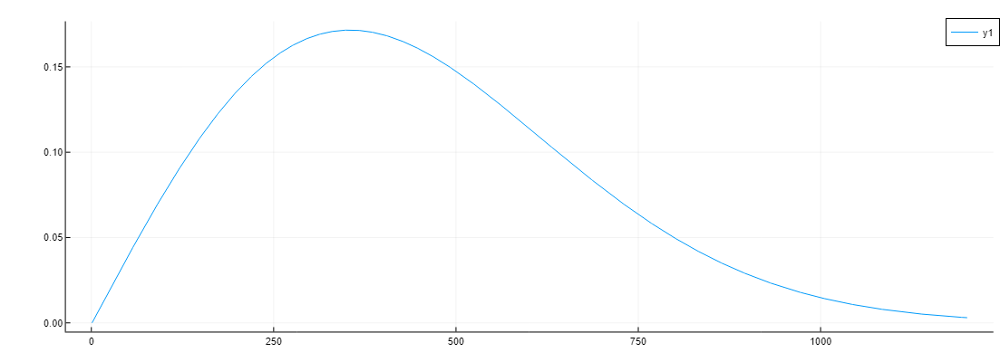

In [26]:
x = 0.0:0.01:12.0

StatsPlots.plot(pdf.(wind,x))

In [27]:
N = 100_000

sample = rand(wind, N)

100000-element Vector{Float64}:
 3.320329501154609
 1.74413807393371
 2.247664338059864
 7.158526184595222
 7.942884897269772
 7.371343968989424
 6.266037398819223
 2.1841288104945757
 2.341264924203129
 3.5918469207569546
 2.266400630566457
 4.5755588204180055
 3.6238122583024
 ⋮
 3.9156303054233903
 4.109988984200366
 2.756842135094284
 4.227332134024373
 8.309474262388823
 0.6123025898621135
 6.232409309002367
 3.8162455308284886
 5.665274825651814
 4.286621642079186
 4.4719346585926685
 5.960726290180682

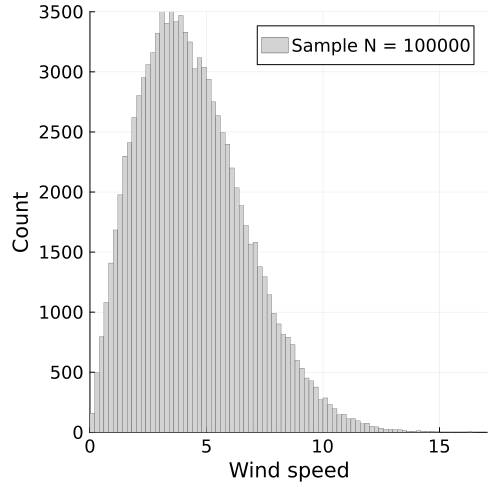

In [49]:
gr()
Plots.histogram(
    sample, 
    label="Sample N = "*string(N),
    xlabel="Wind speed",
    ylabel="Count",
    lw=0.2,
    c=:lightgray,
    xlims = (0, max(sample...)),
    ylims = (0, 3500),
    legend=:topright,
    size=(500,500),
    xtickfontsize=12,
    ytickfontsize=12,
    xlabelfontsize=14,
    ylabelfontsize=14,
    legendfontsize=12,
)

In [32]:
using PGFPlotsX
pgfplotsx()

Plots.PGFPlotsXBackend()

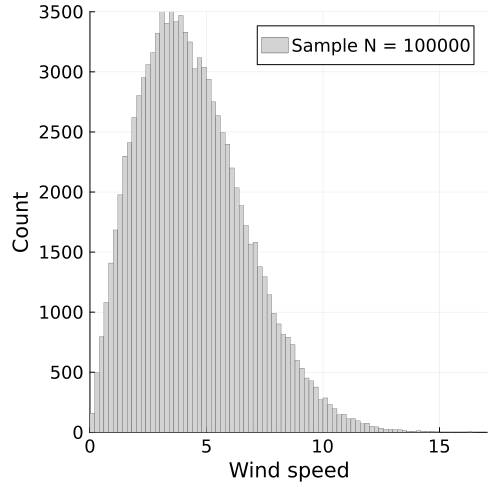

In [50]:
Plots.histogram(
    sample, 
    label="Sample N = "*string(N),
    xlabel="Wind speed",
    ylabel="Count",
    lw=0.2,
    c=:lightgray,
    xlims = (0, max(sample...)),
    ylims = (0, 3500),
    legend=:topright,
    size=(500,500),
    xtickfontsize=12,
    ytickfontsize=12,
    xlabelfontsize=14,
    ylabelfontsize=14,
    legendfontsize=12,
)

In [51]:
mean(sample)

4.421401418125661

In [52]:
weibull_est = fit_mle(Weibull, sample)

Weibull{Float64}(α=1.9979883021905371, θ=4.98883378474073)

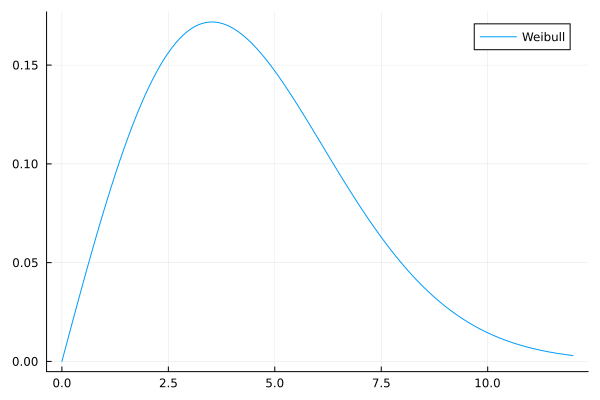

In [54]:
Plots.plot(x, pdf.(weibull_est, x), label="Weibull")


In [55]:
rayleigh_est = fit_mle(Rayleigh, sample)

Rayleigh{Float64}(σ=3.5283894823553155)

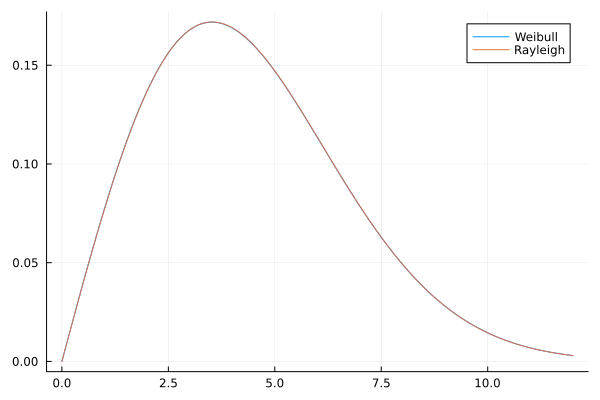

In [56]:
plot!(x, pdf.(rayleigh_est, x), label="Rayleigh")


## Scenario Generation and Reduction

Often times, our optimization problems depend on **random** input variables. These are typically parameters to our problem, e.g., wind speeds or solar irradiation. In most problems, analyzing optimization problems with random parameters is not tractable in a closed form. Instead, we rely on a **Monte Carlo** approach. This means: We generate **scenarios** based on the known or estimated distributions of all random variables. We then optimize our decision variables against, e.g., the expected cost over these scenarios or the worst cast. Other risk measures (you might have heard of (conditional) vaule-at-risk or μ-σ rules) are possible.

If the complexity of our random variables is high, we might want to create many scenarios to capture their characteristics. This can lead to huge problem sizes that might make our program too large to be handled by the memory or too slow to solve. In these cases, we can try to reduce the number of scenarios. The idea behind scenario reduction is to retain the essence of previously created scenarios while reducing their number. The difference between just generating fewer scenarios to scenario reduction is straight-forward: In a reduction method, we can select scenarios to be kept (in particular, extreme scenarios) and assign other scenarios' probabilities depending on their closeness to these scenarios. If we only generate few scenarios, the probability of ever seeing extreme values are very slim. 

In [57]:
gr()

Plots.GRBackend()

### Simple scenario generation - independence

In [58]:
S = 10000

10000

In [59]:
si = 0.25 # solar irradiation
β = ((si*(1+si)/(si/10))-1)*(1-si)
α = si*β/(1-si)

2.875

In [60]:
solar = Beta(α, β)
load = Normal(90.0, 90/11)
wind = Rayleigh(6.5 * 1.128)

dist_vec = [solar, load, wind]

3-element Vector{Distribution{Univariate, Continuous}}:
 Beta{Float64}(α=2.875, β=8.625)
 Normal{Float64}(μ=90.0, σ=8.181818181818182)
 Rayleigh{Float64}(σ=7.331999999999999)

In [61]:
scenarios = hcat(rand.(dist_vec, S)...)' # more convenient dimension!

3×10000 adjoint(::Matrix{Float64}) with eltype Float64:
  0.106791    0.146072   0.227944  …   0.232115   0.338605    0.230276
 90.8312    102.049     88.7185       93.6079    68.0691    101.133
  9.20476     7.52072   16.1616        3.52605    6.68409    19.4

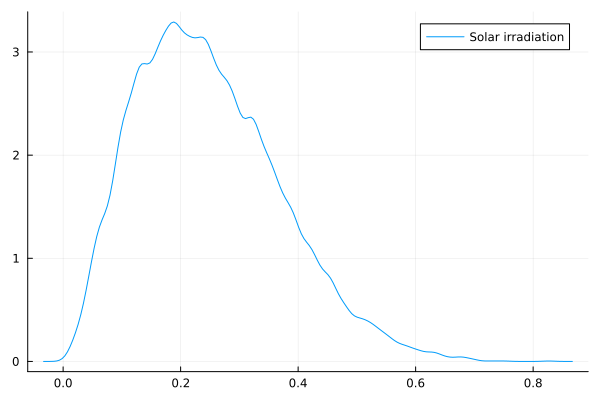

In [62]:
density(scenarios[1, :], bandwidth= 0.01,label="Solar irradiation")

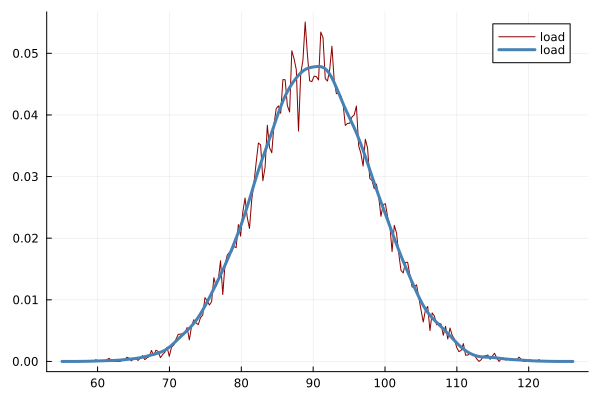

In [63]:
density(scenarios[2,:], bandwidth= 0.001, color= :darkred,label="load")
density!(scenarios[2,:], color=:steelblue, lw=3, label="load")

┌ Warning: Keyword argument `orientation` is deprecated.
│ Please use `permute` instead.
└ @ Plots ~/.julia/packages/Plots/sxUvK/src/args.jl:1552


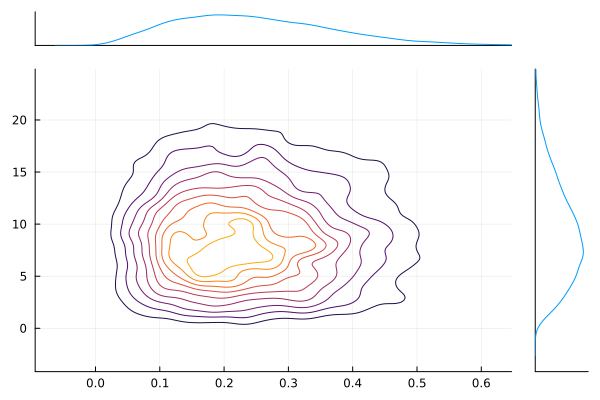

In [64]:
marginalkde(scenarios[1, :], scenarios[3, :])

### With stochastic dependence

We'll use a trick here (basically using Gaussian Copulas): First, we'll create three dependent normally distributed RVs. We'll transform these into uniform RVs, then re-transforming into our desired distributions.

In [65]:
# Create standard and multivariate Normal Distribution
stdnorm = Normal(0, 1.0)
mvnorm = MvNormal([0.0, 0.0, 0.0], [1.0 0.0 0.5; 0.0 1.0 -0.5; 0.5 -0.5 1.0])

FullNormal(
dim: 3
μ: [0.0, 0.0, 0.0]
Σ: [1.0 0.0 0.5; 0.0 1.0 -0.5; 0.5 -0.5 1.0]
)


In [66]:
[1.0 0.0 0.5; 0.0 1.0 -0.5; 0.5 -0.5 1.0]

3×3 Matrix{Float64}:
 1.0   0.0   0.5
 0.0   1.0  -0.5
 0.5  -0.5   1.0

In [67]:
# Generate and normalize scenarios
mvn_sample = rand(mvnorm, S)
uni_sample = cdf.(stdnorm, mvn_sample)

3×10000 Matrix{Float64}:
 0.771447  0.808708  0.869258  0.456129  …  0.781697   0.913897  0.830553
 0.952118  0.272733  0.907991  0.33338      0.0120995  0.600712  0.785823
 0.351493  0.966893  0.182891  0.531525     0.968739   0.382953  0.850391

In [68]:
# De-normalize scenarios
scenarios2 = quantile.(dist_vec, uni_sample) # quantile is inverse cdf

3×10000 Matrix{Float64}:
   0.337622   0.356775    0.39444  …   0.342667   0.43163   0.369227
 103.629     85.0535    100.869       71.5585    92.0879   96.4801
   6.82374   19.1421      4.66009     19.3025     7.20486  14.2917

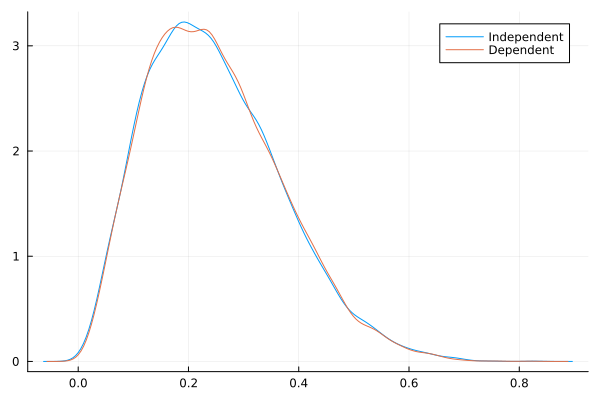

In [69]:
density(scenarios[1, :], label="Independent")
density!(scenarios2[1, :], label="Dependent")

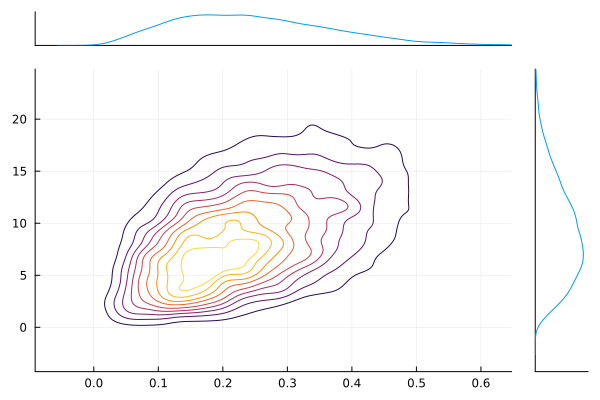

In [70]:
marginalkde(scenarios2[1, :], scenarios2[3, :])

## Clustering

In [71]:
km = kmeans(scenarios, 5)

KmeansResult{Matrix{Float64}, Float64, Int64}([0.2445767603942944 0.25100128295410645 … 0.24767251244123412 0.24842520991902525; 90.35118636749736 78.8803139729574 … 85.20286607938019 95.48815217781429; 6.0676896632876645 7.315638633315489 … 14.089034168515887 14.237017610615272], [1, 3, 4, 3, 1, 2, 4, 4, 2, 3  …  5, 2, 2, 5, 1, 2, 2, 1, 2, 5], [10.090630969378253, 0.057953735638875514, 16.655698976581334, 152.46794810198116, 7.873416605354578, 9.306468629369192, 25.432833938264594, 32.77258823181364, 8.356052294033361, 56.433185276935546  …  39.74591272490579, 54.561446608284314, 22.540072828329357, 33.638297955098096, 22.425083632311726, 16.921509882291502, 18.260855698514206, 17.066135005054093, 117.28975519270716, 58.51668854182935], [3176, 1811, 1676, 1661, 1676], [3176, 1811, 1676, 1661, 1676], 227645.8581108757, 23, true)

In [72]:
km.centers

3×5 Matrix{Float64}:
  0.244577   0.251001    0.249278   0.247673   0.248425
 90.3512    78.8803    101.992     85.2029    95.4882
  6.06769    7.31564     7.3109    14.089     14.237

In [73]:
gr()

Plots.GRBackend()

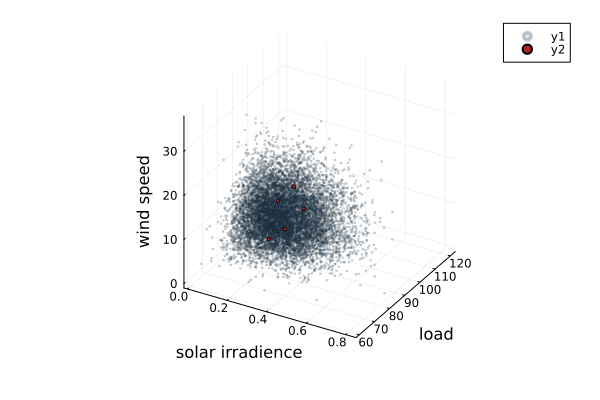

In [74]:
Plots.scatter(scenarios[1, :], scenarios[2, :], scenarios[3, :], alpha=0.2, marker=1, color=:steelblue, xlabel = "solar irradience", ylabel= "load", zlabel= "wind speed")
Plots.scatter!(km.centers[1, :], km.centers[2, :], km.centers[3, :], marker=2, color=:firebrick)

In [75]:
plotlyjs() # for interactive 3D plots


Plots.PlotlyJSBackend()

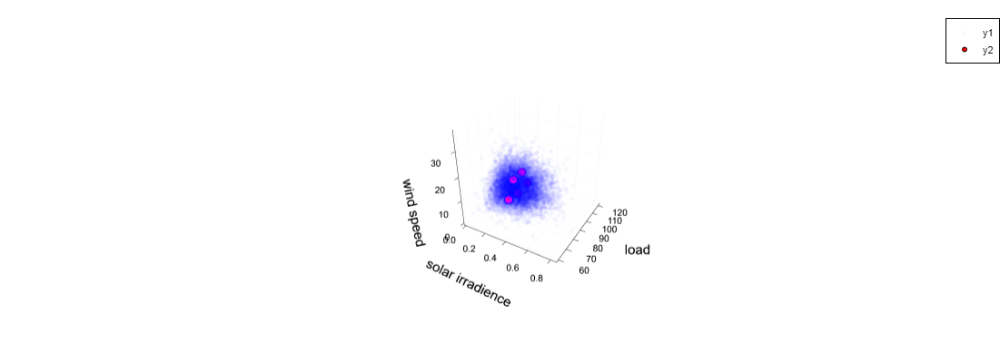

In [76]:
Plots.scatter(scenarios[1, :], scenarios[2, :], scenarios[3, :], alpha=0.03, marker=1, color=:blue
, xlabel = "solar irradience", ylabel= "load", zlabel= "wind speed")
Plots.scatter!(km.centers[1, :], km.centers[2, :], km.centers[3, :], marker=2.5, color=:red)

Order of magnitude matters!

In [77]:
μs = mean.(eachrow(scenarios))

3-element Vector{Float64}:
  0.24768729659706545
 90.23056695242376
  9.20358015348294

In [78]:
stds = std.(eachrow(scenarios))

3-element Vector{Float64}:
 0.1218646933404915
 8.243176437778235
 4.768469554601319

In [79]:
normalized_scenarios = (scenarios .- μs) ./ stds

3×10000 Matrix{Float64}:
 -1.15617      -0.833835  -0.162014  …  -0.127782   0.746052  -0.142875
  0.0728674     1.43371   -0.183431      0.40971   -2.68847    1.32256
  0.000247355  -0.352914   1.45917      -1.19064   -0.528365   2.13829

In [80]:
kmn = kmeans(normalized_scenarios, 5)

KmeansResult{Matrix{Float64}, Float64, Int64}([1.1227478321951179 -0.6444113431963104 … -0.6528487252831755 -0.20412242711916315; 0.8230145252743607 -0.7552417719491721 … 0.9346351981123949 -0.05808634946167286; -0.20553616797776797 -0.48076366888434935 … -0.38771512216304904 1.4064051823837573], [4, 4, 5, 1, 1, 3, 3, 5, 3, 4  …  1, 5, 3, 4, 2, 2, 2, 4, 3, 5], [1.1464917558054748, 0.28304138448927496, 0.020269139298910943, 6.004026550197832, 1.1129078446734813, 2.456656665132174, 1.68170675512373, 7.604213200534617, 0.13770440011769036, 3.0853087150940492  …  2.4730519139189457, 2.4761137444377295, 0.2516877186090829, 0.3125006281015865, 0.12741604492747838, 1.322406002051745, 1.1633650501431223, 1.1959282328978693, 3.5484660138237842, 2.445590457937678], [1593, 2566, 1559, 2225, 2057], [1593, 2566, 1559, 2225, 2057], 13114.808382640398, 73, true)

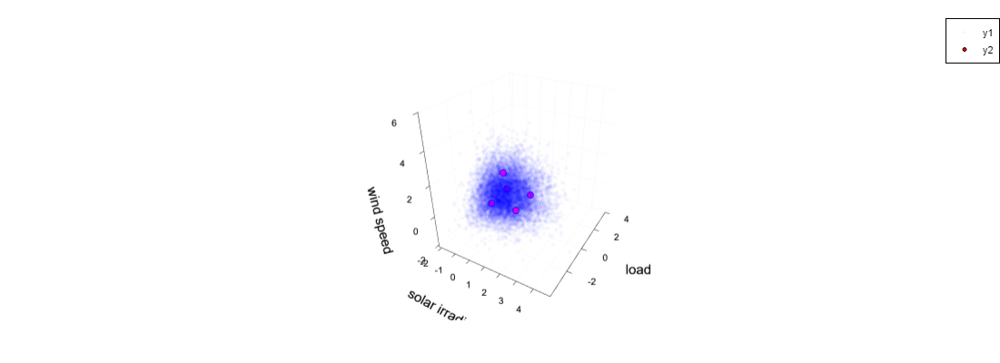

In [81]:
plotlyjs()

Plots.scatter(
    normalized_scenarios[1, :], 
    normalized_scenarios[2, :], 
    normalized_scenarios[3, :], 
    alpha=0.03, marker=1, color=:blue
    , xlabel = "solar irradience", ylabel= "load", zlabel= "wind speed")

Plots.scatter!(
    kmn.centers[1, :], 
    kmn.centers[2, :], 
    kmn.centers[3, :], 
    marker=2, color=:red)

In [82]:
kmn.centers .* stds .+ μs

3×5 Matrix{Float64}:
  0.384511   0.169156   0.383504   0.168128   0.222812
 97.0148    84.005     83.1813    97.9349    89.7518
  8.22349    6.91107    7.7683     7.35477   15.91

In [83]:
km.centers

3×5 Matrix{Float64}:
  0.244577   0.251001    0.249278   0.247673   0.248425
 90.3512    78.8803    101.992     85.2029    95.4882
  6.06769    7.31564     7.3109    14.089     14.237

In [84]:
counts(kmn) / 10000

5-element Vector{Float64}:
 0.1593
 0.2566
 0.1559
 0.2225
 0.2057

Especially for high-dimensional uncertainty (e.g., probabilistic time series), K-Means may flatten the profiles heavily, just retaining seasonal trends. To avoid this issue, K-Medoids can be used. Whereas K-Means uses the (arithmetic) average of a cluster's points, K-Medoids uses an actual data point with smallest intracluster distance (subject to any distance metric). 

In [85]:
dist = pairwise(Euclidean(), normalized_scenarios, dims=2)
kmed = kmedoids(dist, 5)

KmedoidsResult{Float64}([9184, 1367, 3100, 9400, 2005], [1, 3, 2, 2, 5, 5, 5, 5, 5, 3  …  3, 4, 5, 3, 1, 4, 4, 1, 4, 2], [0.8671845515253354, 1.0788150733249433, 0.6071296571723606, 2.3679533191703865, 0.743959327342277, 1.7657255884085516, 1.4733521317292022, 2.668395886697624, 0.7121496780248195, 1.4888101279356434  …  1.9565530271712683, 0.8990936821630698, 0.7187967617847181, 0.5526609237394923, 0.61589196223171, 1.5395703653546804, 0.9996790690525648, 0.9089045437650177, 2.0689711442282896, 1.391969131552872], [2484, 1919, 1949, 1636, 2012], 10537.28665254008, 9, true)

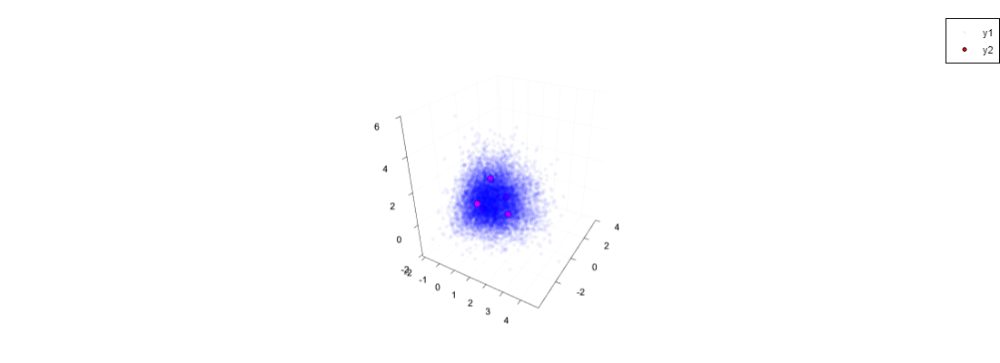

In [86]:
plotlyjs()

Plots.scatter(
    normalized_scenarios[1, :], 
    normalized_scenarios[2, :], 
    normalized_scenarios[3, :], 
    alpha=0.05, marker=1, color=:blue)

Plots.scatter!(
    normalized_scenarios[:, kmed.medoids][1, :], 
    normalized_scenarios[:, kmed.medoids][2, :], 
    normalized_scenarios[:, kmed.medoids][3, :], 
    marker=2, color=:red)

## Stochastic Optimization: Example 3.3 // Lecture 5-1: slide 24 ff (from: Morales et al., 2014)

### Create Dispatch Model

In [2]:
### Data

# for all Models
data = Dict(
    :K => 1:3,
    :N => 1:2,
    :S => 1:2,
    :C => [10.0, 30.0, 35.0],
    :Cu => [16.0, 13.0, 10.0],
    :Cd => [15.0, 12.0, 9.0],
    :Pmax => [50.0, 110.0, 100.0],
    :L => [40.0, 100.0],
    :MG => [1, 1, 2],
    :MN => [0 1; 1 0] |> BitArray,
    :X => [0 0.13; 0.13 0],
    :Tmax => [0 100; 100 0],
    :vLOL => 200.0,
    :w => [50 10; 0 0],
    :pi => [0.6, 0.4]
    )

Dict{Symbol, Any} with 15 entries:
  :Cd   => [15.0, 12.0, 9.0]
  :MG   => [1, 1, 2]
  :N    => 1:2
  :Tmax => [0 100; 100 0]
  :MN   => Bool[0 1; 1 0]
  :Pmax => [50.0, 110.0, 100.0]
  :pi   => [0.6, 0.4]
  :w    => [50 10; 0 0]
  :vLOL => 200.0
  :K    => 1:3
  :L    => [40.0, 100.0]
  :S    => 1:2
  :X    => [0.0 0.13; 0.13 0.0]
  :Cu   => [16.0, 13.0, 10.0]
  :C    => [10.0, 30.0, 35.0]

In [3]:
mutable struct DispatchModel
    data::Dict{Symbol, Any}
    m::Union{JuMP.Model, Nothing}
    vars::Dict
    cons::Dict
    exprs::Dict
    obj
end

In [4]:
function DispatchModel(dd::Dict)
 x   return DispatchModel(dd, Model(HiGHS.Optimizer), Dict(), Dict(), Dict(), nothing)
end

DispatchModel

In [5]:
DispatchModel() = DispatchModel(data)

DispatchModel

In [6]:
optimize!(dm::DispatchModel) = JuMP.optimize!(dm.m)

optimize! (generic function with 1 method)

### Generate Auxiliary Functions

In [7]:
# Change data without creating a new model
function set_data!(dm, pair::Pair)
    dm.data[pair[1]] = pair[2]
end

set_data! (generic function with 1 method)

In [8]:
# Reset dispatch model
function reset!(dm::DispatchModel)
    dm = DispatchModel()
end

reset! (generic function with 1 method)

In [9]:
# Reset model within DispatchModel object
function reset_m!(dm::DispatchModel)
    dm.m = Model(HiGHS.Optimizer)
    dm.vars = Dict()
    dm.cons = Dict()
    dm.exprs = Dict()
    dm.obj = nothing
end

reset_m! (generic function with 1 method)

### Functions to Init Model etc.

In [10]:
function init_vars!(dm::DispatchModel)
    m = dm.m
    K = dm.data[:K]
    S = dm.data[:S]
    N = dm.data[:N]
    
    dm.vars[:P] = @variable(m, P[k in K] >= 0)
    dm.vars[:Ru] = @variable(m, Ru[k in K] >= 0)
    dm.vars[:Rd] = @variable(m, Rd[k in K] >= 0)
    dm.vars[:Pu] = @variable(m, Pu[k in K, s in S] >= 0)
    dm.vars[:Pd] = @variable(m, Pd[k in K, s in S] >= 0)
    dm.vars[:Wsc] = @variable(m, Wsc[n in N] >= 0)
    dm.vars[:Lsh] = @variable(m, Lsh[n in N, s in S] >= 0)
    dm.vars[:Wsp] = @variable(m, Wsp[n in N, s in S] >= 0)
    dm.vars[:del0] = @variable(m, del0[n in N])
    dm.vars[:del] = @variable(m, del[n in N, s in S])
    dm.vars[:β] = @variable(m, β)
    
    fix(dm.vars[:del0][1], 0)
    fix.(dm.vars[:del][1, :], 0)
    
    return nothing
end

init_vars! (generic function with 1 method)

In [11]:
function init_cons!(dm)
    ## These are just convenience assignments! For performance-optimized code, the
    ## references to the dictionaries should be used directly in the constraint defs.
    m = dm.m
    N = dm.data[:N]
    MN = dm.data[:MN]
    MG = dm.data[:MG]
    S = dm.data[:S]
    K = dm.data[:K]
    Pmax = dm.data[:Pmax]
    L = dm.data[:L]
    w = dm.data[:w]
    pi = dm.data[:pi]
    X = dm.data[:X]
    
    P = dm.vars[:P] 
    Ru = dm.vars[:Ru] 
    Rd = dm.vars[:Rd] 
    Pu = dm.vars[:Pu] 
    Pd = dm.vars[:Pd] 
    Wsc = dm.vars[:Wsc] 
    Lsh = dm.vars[:Lsh] 
    Wsp = dm.vars[:Wsp] 
    del0 = dm.vars[:del0] 
    del = dm.vars[:del]
    β = dm.vars[:β]
    
    dm.cons[:bal0] = @constraint(m, bal0[n in N],
        sum(P[k] for k in K[MG .== n]) + Wsc[n] - L[n] ==
        sum((del0[n] - del0[mm])/X[n, mm] for mm in N[MN[n, :] .== 1]))

    dm.cons[:PRu] = @constraint(m, PRu[k in K], P[k] + Ru[k] <= Pmax[k])
    @constraint(m, PRl[k in K], P[k] - Rd[k] >= 0)
    
    dm.cons[:bal] = @constraint(m, bal[n in N, s in S],
        sum(Pu[k,s]-Pd[k,s] for k in K[MG .== n]) + 
        Lsh[n,s] + w[n,s] - Wsc[n] - Wsp[n,s] == 
        sum((del[n,s] - del0[n] - del[mm,s] + del0[mm])/X[n,mm] 
            for mm in N[MN[n, :] .== 1])
        )
    
    dm.cons[:Puu] = @constraint(m, Puu[k in K, s in S],
        Pu[k,s] <= Ru[k])

    dm.cons[:Pdu] = @constraint(m, Pdu[k in K, s in S],
        Pd[k, s] <= Rd[k])
    
    dm.cons[:Wspu] = @constraint(m, Wspu[n in N, s in S],
        Wsp[n,s] <= w[n,s])
    
    dm.cons[:LSHU] = @constraint(m, LSHU[n in N, s in S],
        Lsh[n, s] <= L[n])
    
    return nothing
end

init_cons! (generic function with 1 method)

In [12]:
function init_network_cons!(dm)
    m = dm.m
    N = dm.data[:N]
    Tmax = dm.data[:Tmax]
    S = dm.data[:S]
    MN = dm.data[:MN]
    X = dm.data[:X]
    
    del0 = dm.vars[:del0]
    del = dm.vars[:del]
    
    dm.cons[:TCO] = @constraint(m, TCO[n in N, mm in N[MN[n, :] .== 1]],
        (del0[n] - del0[mm])/X[n,mm] <= Tmax[n,mm])
    
    dm.cons[:TC] = @constraint(m, TC[n in N, mm in N[MN[n, :] .== 1], s in S],
        (del[n,s] - del0[n] - del[mm,s] + del0[mm])/X[n,mm] <= Tmax[n,mm])
    
    return nothing
end

init_network_cons! (generic function with 1 method)

In [13]:
function init_expr!(dm)
    m = dm.m
    pi = dm.data[:pi]
    N = dm.data[:N]
    S = dm.data[:S]
    K = dm.data[:K]
    C = dm.data[:C]
    Cu = dm.data[:Cu]
    Cd = dm.data[:Cd]
    vLOL = dm.data[:vLOL]
    
    P = dm.vars[:P]
    Pu = dm.vars[:Pu]
    Pd = dm.vars[:Pd]
    Ru = dm.vars[:Ru]
    Rd = dm.vars[:Rd]
    Lsh = dm.vars[:Lsh]
    β = dm.vars[:β]
    
    dm.exprs[:EC] = @expression(m, EC, 
        sum(C[k]*P[k] + Cu[k]*Ru[k] + Cd[k]*Rd[k] for k in K) +
        sum(
            pi[s]*(sum(
                C[k]*(Pu[k,s]-Pd[k,s])
                for k in K) 
            + vLOL*sum(Lsh[n,s] for n in N))
            for s in S)
        )
    
    dm.exprs[:WC] = @expression(m, WCC,
        sum(C[k]*P[k] + Cu[k]*Ru[k] + Cd[k]*Rd[k] for k in K) + β)
    
    return nothing
end

init_expr! (generic function with 1 method)

### Create and Optimize

In [14]:
dm = DispatchModel()

init_vars!(dm)
init_cons!(dm)
init_expr!(dm)

In [15]:
dm.obj = @objective(dm.m, Min, dm.exprs[:EC])

10 P[1] + 16 Ru[1] + 15 Rd[1] + 30 P[2] + 13 Ru[2] + 12 Rd[2] + 35 P[3] + 10 Ru[3] + 9 Rd[3] + 6 Pu[1,1] - 6 Pd[1,1] + 18 Pu[2,1] - 18 Pd[2,1] + 21 Pu[3,1] - 21 Pd[3,1] + 120 Lsh[1,1] + 120 Lsh[2,1] + 4 Pu[1,2] - 4 Pd[1,2] + 12 Pu[2,2] - 12 Pd[2,2] + 14 Pu[3,2] - 14 Pd[3,2] + 80 Lsh[1,2] + 80 Lsh[2,2]

In [16]:
print(dm.m)

In [17]:
optimize!(dm)

Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
24 rows, 32 cols, 73 nonzeros
22 rows, 30 cols, 72 nonzeros
Presolve : Reductions: rows 22(-10); columns 30(-8); elements 72(-21)
Solving the presolved LP
Using EKK dual simplex solver - serial
  Iteration        Objective     Infeasibilities num(sum)
          0    -2.4158461226e+04 Ph1: 14(3860.15); Du: 9(144.038) 0s
         16     2.6200000000e+03 Pr: 0(0) 0s
Solving the original LP from the solution after postsolve
Model   status      : Optimal
Simplex   iterations: 16
Objective value     :  2.6200000000e+03
HiGHS run time      :          0.03


In [18]:
# Print variables
for (key, ref) in dm.vars
    if typeof(ref) <: AbstractArray
        print(key, "*\t= ", round.(value.(ref).data, digits=2))
    else
        print(key, "*\t= ", round(value(ref), digits=2))
    end
    println()
end

Wsc*	= [10.0, 0.0]
Wsp*	= [0.0 0.0; 0.0 0.0]
Pu*	= [-0.0 -0.0; 0.0 -0.0; 0.0 -0.0]
del0*	= [0.0, -7.8]
Rd*	= [0.0, 0.0, 40.0]
Ru*	= [0.0, 0.0, 0.0]
Pd*	= [0.0 0.0; -0.0 0.0; 40.0 0.0]
Lsh*	= [0.0 0.0; 0.0 0.0]
β*	= 0.0
P*	= [50.0, 40.0, 40.0]
del*	= [0.0 0.0; -13.0 -7.8]


In [19]:
objective_value(dm.m)

2620.0